In [1]:
#initialization

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from IPython import get_ipython

from IPython.display import clear_output
import mne
from utils import load_eeg_data, FREQ_BANDS, CHANNEL_GROUPS

# Backend for plots (run once per session). Uses inline so it works on cluster and locally.
ip = get_ipython()
if ip is not None:
    ip.run_line_magic("matplotlib", "inline")
    mne.viz.set_browser_backend("matplotlib")
print("Backend:", mne.viz.get_browser_backend())

# Optional (local only): for scroll, run instead: ip.run_line_magic("matplotlib", "qt") and mne.viz.set_browser_backend("qt"). On cluster use inline.

# Default subject and data path check
SUBJECT_ID = 5
DATA_DIR = Path("dataset")
if not DATA_DIR.exists():
    print("Warning: 'dataset' folder not found. Create it and add .set files.")
else:
    print("Data directory OK:", DATA_DIR.resolve())

Using matplotlib as 2D backend.
Backend: matplotlib
Data directory OK: C:\Users\seanc\cogphys\dataset


In [2]:
def correlation_heatmap(epochs, title="Channel correlation", ax=None):
    """Compute Pearson correlation across channels (averaged over time and trials) and plot heatmap."""
    data = epochs.get_data()  # (n_epochs, n_chs, n_times)
    # Flatten time: (n_epochs * n_times, n_chs)
    n_ep, n_ch, n_t = data.shape
    data_flat = data.transpose(0, 2, 1).reshape(-1, n_ch)
    corr = np.corrcoef(data_flat.T)
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))
    im = ax.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1, aspect="auto")
    ax.set_xticks(range(n_ch))
    ax.set_yticks(range(n_ch))
    ax.set_xticklabels(epochs.ch_names, rotation=90, ha="right")
    ax.set_yticklabels(epochs.ch_names)
    plt.colorbar(im, ax=ax, label="Pearson r")
    ax.set_title(title)
    return fig,ax

def _corr_matrix(epochs):
    """Return Pearson correlation matrix (n_ch, n_ch) from epochs."""
    data = epochs.get_data()
    n_ep, n_ch, n_t = data.shape
    data_flat = data.transpose(0, 2, 1).reshape(-1, n_ch)
    return np.corrcoef(data_flat.T)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


c:\Users\seanc\cogphys\utils.py:127: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(file_path, verbose=False)
c:\Users\seanc\cogphys\utils.py:127: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(file_path, verbose=False)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


c:\Users\seanc\cogphys\utils.py:127: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(file_path, verbose=False)


(<Figure size 1200x1200 with 2 Axes>,
 <Axes: title={'center': 'P1, t = 0.0,0.05'}>)

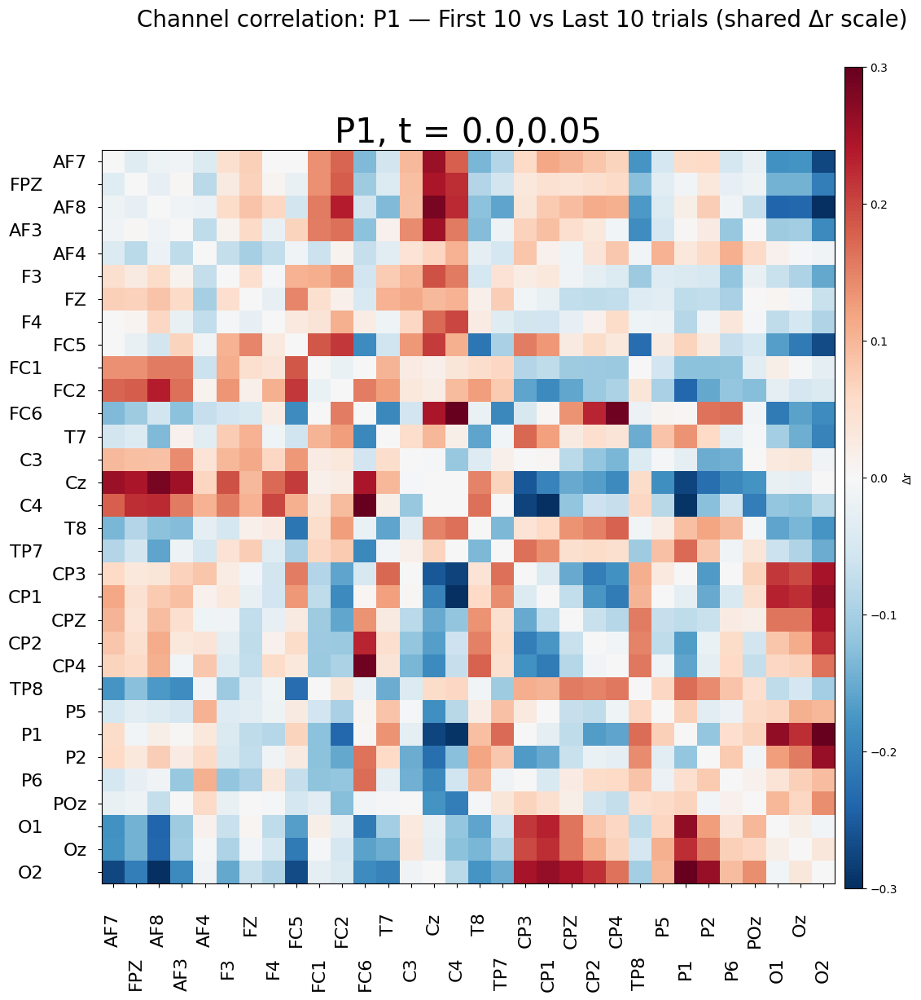

In [48]:
def corrdiff(initial, final):
    fig, ax = plt.subplots(1,1, figsize = (12,12))

    epochs = load_eeg_data(condition = "P1",subject_id= 5)
    n = len(epochs)
    startidx = epochs.time_as_index(initial)
    endidx = epochs.time_as_index(final)
    first = load_eeg_data(condition = "P1", subject_id = 5, tmin = initial-.025, tmax = initial + .025)
    last = load_eeg_data(condition = "P1", subject_id = 5, tmin = final - .025, tmax = final + .025)
    diff = _corr_matrix(first)-_corr_matrix(last)
    numch = len(epochs.ch_names)

    diff_max = np.abs(diff).max()
    diff_lim = max(diff_max, 1e-6)
    mat, title, vmin, vmax = diff, "Last-First", -diff_lim, diff_lim
    xticks = np.arange(numch) + .5
    yticks = np.arange(numch) + .5
    xticklabels = epochs.ch_names
    yticklabels = epochs.ch_names
    im_col = []
    im = ax.imshow(mat, cmap="RdBu_r", vmin=-.3, vmax=.3, aspect="equal",
    extent=[0, numch, numch, 0], origin="upper", interpolation="nearest"
    )
    im_col.append(im)
    ax.set_xlim(0, numch)
    ax.set_ylim(numch, 0)
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_xticklabels(xticklabels, rotation=90, ha="center", fontsize=16)
    ax.set_yticklabels(yticklabels, fontsize=16)
    ax.set_title(f"P1, t = {np.round(initial,3)},{np.round(final,3)}", fontsize=30)
    for ii, lbl in enumerate(ax.get_xticklabels()):
        pos = list(lbl.get_position())
        offset = 0.04 if ii % 2 == 0 else 0.10
        lbl.set_position((pos[0], pos[1] - offset))
        lbl.set_transform(ax.get_xaxis_transform())
    for ii, lbl in enumerate(ax.get_yticklabels()):
        pos = list(lbl.get_position())
        offset = 0.02 if ii % 2 == 0 else 0.08
        lbl.set_position((pos[0] - offset, pos[1]))
        lbl.set_transform(ax.get_yaxis_transform())
    fig.subplots_adjust(left=0.07, right=0.82, top=0.88, bottom=0.04, wspace=0.8)
    cax = fig.add_axes([0.83 + 0, 0.08, 0.018, 0.84])
    cb = fig.colorbar(im_col[0], cax=cax, label="Δr")
    cb.ax.tick_params(labelsize=10)
    fig.suptitle(f"Channel correlation: P1 — First 10 vs Last 10 trials (shared Δr scale)", fontsize=20, y=0.98)
    return(fig, ax)


corrdiff(0.0,0.05)

#for i in range(int(nbins)):
#    bin = load_eeg_data(condition = "P1", subject_id = 5, tmin = start + i*.025, tmax = start + (i+2)*.025)
#    correlation_heatmap(bin)
#bin1 = load_eeg_data(condition = "P1", subject_id = 5, tmin = 0, tmax = .05)
#bin2 = load_eeg_data(condition = "P1", subject_id = 5, tmin = .025, tmax = .075)
#correlation_heatmap(bin1, title = "P1 Channel correlation (first 25ms)")
#correlation_heatmap(bin2, title = "P1 Channel correlation (second 25ms)")
#for i in range(num_bins):
#correlation_heatmap()
#_corr_matrix(epochs[10:])
#_corr_matrix(epochs[-10:])    



In [44]:
%%capture

import io
from PIL import Image
frame_images = []
epochs = load_eeg_data(condition = "P1", subject_id = 5)
nbins = int((epochs.times[-1] - epochs.times[0])//.025)
bins = np.linspace(epochs.times[0], epochs.times[-1], nbins)
for i in bins[:-1:]:
    fig,ax = corrdiff(i,i+.05)
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=100)
    buf.seek(0)
    frame_images.append(np.array(Image.open(buf)))
    plt.close(fig)

In [49]:
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
rc('animation', html='jshtml')

fig, ax = plt.subplots(figsize=(12, 12))
ax.axis("off")
im = ax.imshow(frame_images[0])

def update(frame):
    im.set_array(frame_images[frame])
    return im,

ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(frame_images),
    interval=200,
    blit=True,
    repeat=True
)

plt.close(fig)
HTML(ani.to_jshtml())

KeyboardInterrupt: 

In [39]:
%%capture

import io
from PIL import Image
frame_images = []
epochs = load_eeg_data(condition = "P2", subject_id = 5)
nbins = int((epochs.times[-1]- epochs.times[0])//.025)
bins = np.linspace(epochs.times[0], epochs.times[-1], nbins)
print(bins)
for i in bins[1:]:
    epochs = load_eeg_data(condition = "P1",subject_id= 5,tmin =i-.025, tmax = i+.025)
    fig,ax = correlation_heatmap(epochs, title = f"Pairwise correlations, time = {np.round(i,3)}")
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=100)
    buf.seek(0)
    frame_images.append(np.array(Image.open(buf)))
    plt.close(fig)

In [40]:
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
rc('animation', html='jshtml')

fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('off')
im = ax.imshow(frame_images[0])

def update(frame):
    im.set_array(frame_images[frame])
    return im,

ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(frame_images),
    interval=200,
    blit=True,
    repeat=True
)

plt.close(fig)
HTML(ani.to_jshtml())

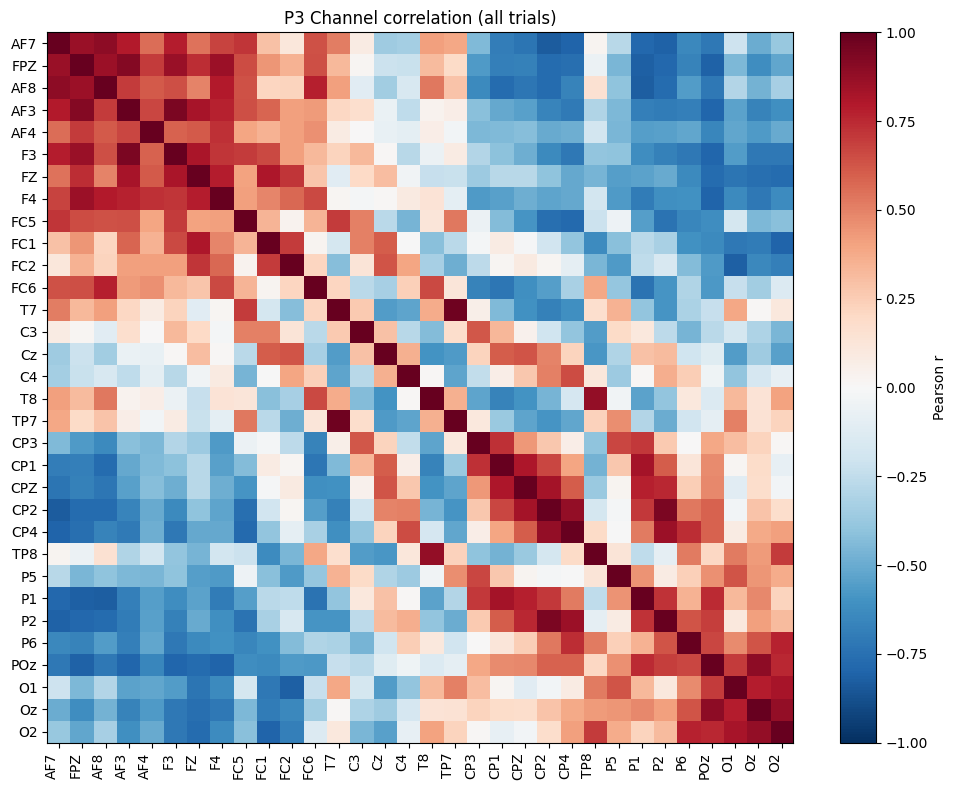

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
correlation_heatmap(epochs, title="P3 Channel correlation (all trials)", ax=ax)
plt.tight_layout()
plt.show()